In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define paths to your dataset
train_dir = 'C:/Users/hp/Downloads/archive (1)/Quality Dataset/train'  # Path to your training data
val_dir = 'C:/Users/hp/Downloads/archive (1)/Quality Dataset/valid'    # Path to your validation data

# Create ImageDataGenerators for loading and augmenting the dataset
train_datagen = ImageDataGenerator(
    rescale=1./255,         # Normalize pixel values between 0 and 1
    rotation_range=20,      # Augment the data by rotating images
    width_shift_range=0.2,  # Shift images horizontally
    height_shift_range=0.2, # Shift images vertically
    shear_range=0.2,        # Shear the images
    zoom_range=0.2,         # Zoom into the images
    horizontal_flip=True,   # Flip the images horizontally
    fill_mode='nearest'     # Fill in missing pixels after transformations
)

val_datagen = ImageDataGenerator(rescale=1./255)

# Load the training and validation data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),  # Resize all images to 150x150
    batch_size=32,           # Use a batch size of 32
    class_mode='binary'      # Binary classification (fresh vs rotten)
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

# Build an improved CNN model
model = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),  # Add dropout to reduce overfitting
    Dense(1, activation='sigmoid')  # Output layer with sigmoid for binary classification
])

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
    epochs=30,  # Increase the number of epochs
    callbacks=[early_stopping]  # Add early stopping
)

# Save the trained model
model.save('fruit_freshness_classifier.h5')

# Evaluate the model
val_loss, val_acc = model.evaluate(val_generator)
print(f"Validation Accuracy: {val_acc * 100:.2f}%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


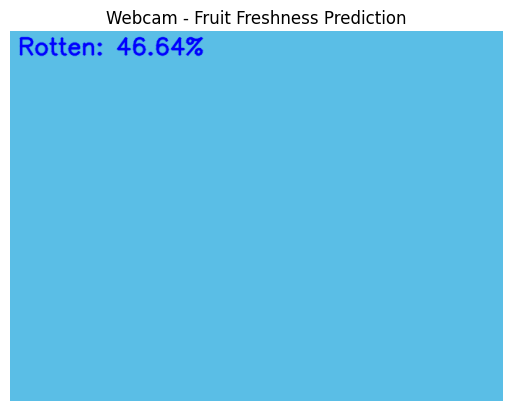

C:\Users\hp\AppData\Local\Temp\ipykernel_8684\3467919193.py:63: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  if plt.waitforbuttonpress(timeout=0.1):  # Wait for a key press in Matplotlib


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


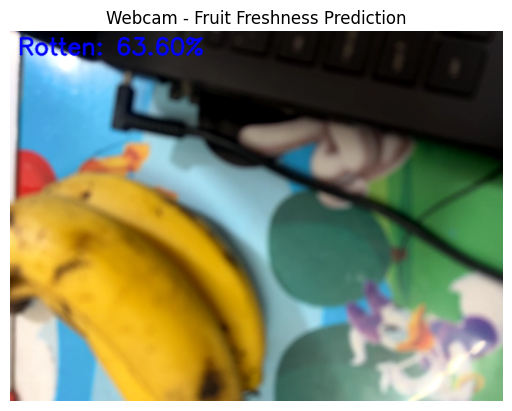

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


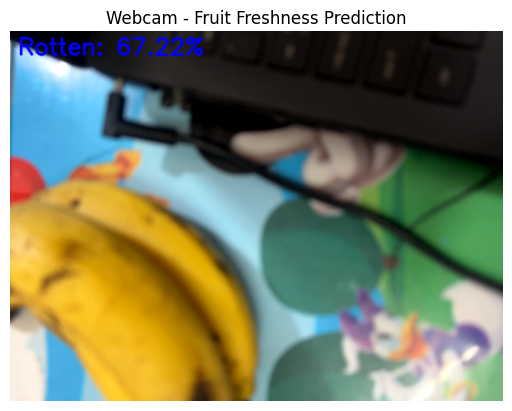

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


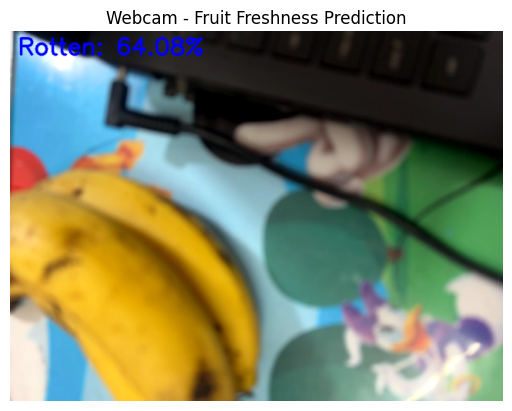

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


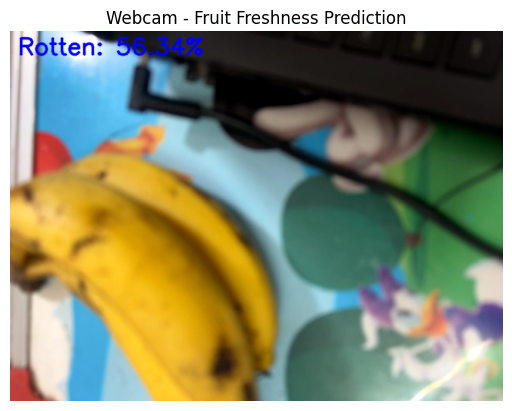

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


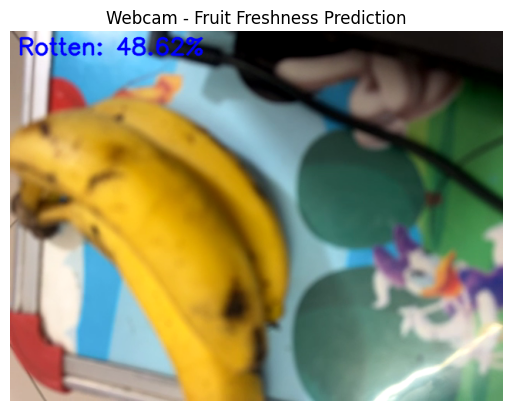

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


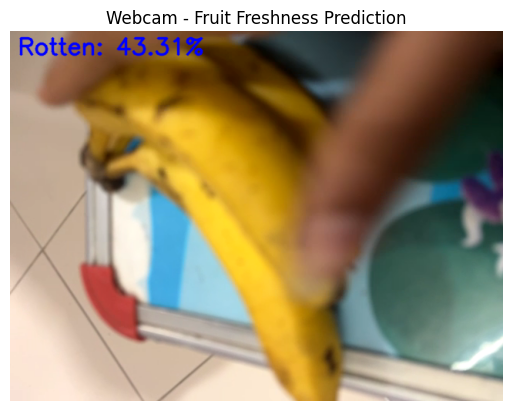

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


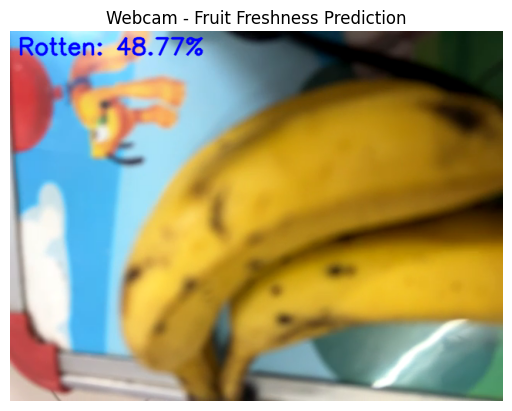

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


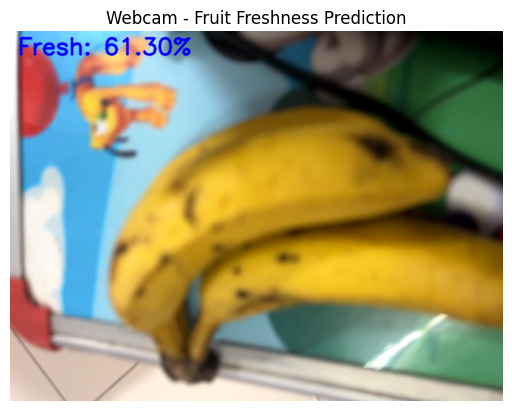

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


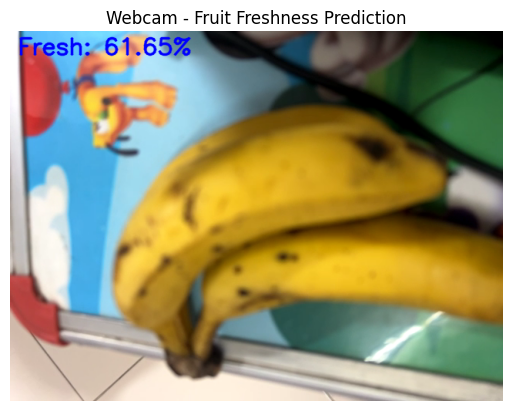

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


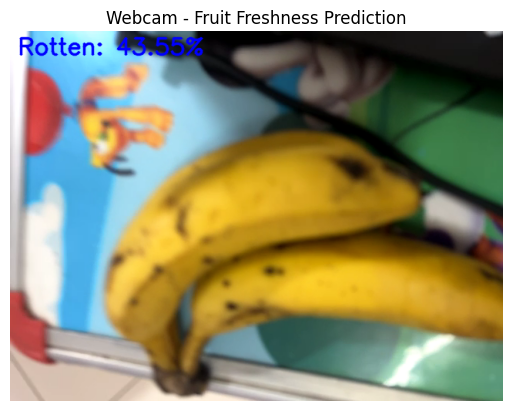

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


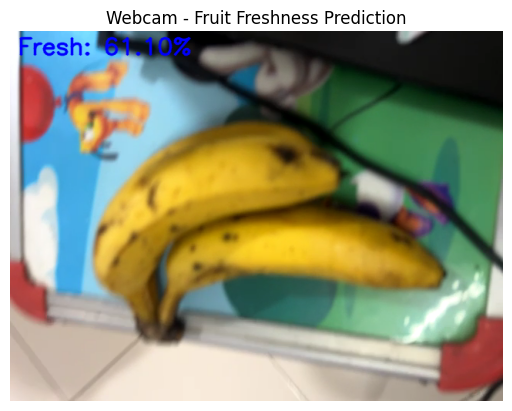

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


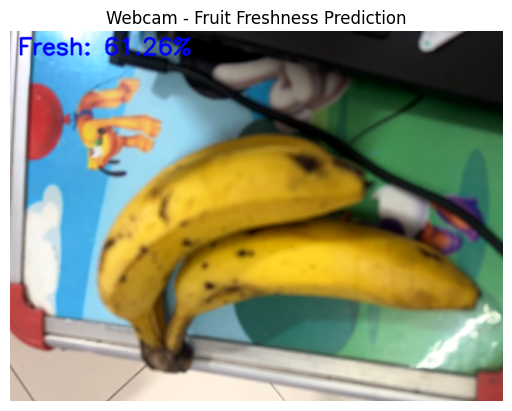

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


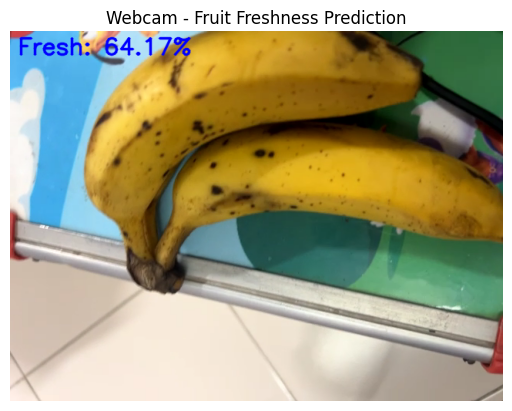

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


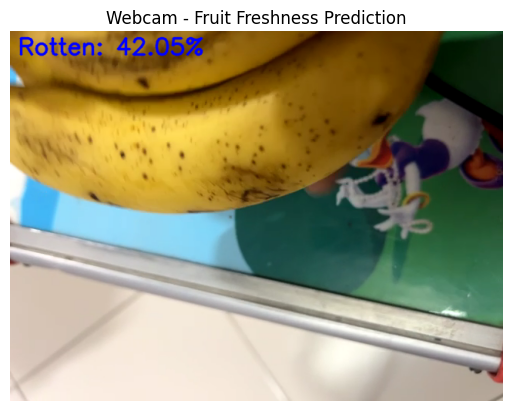

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


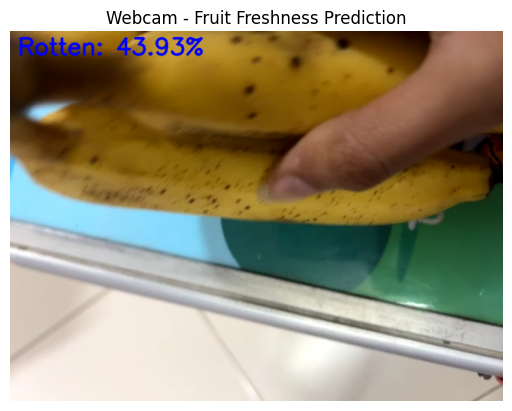

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


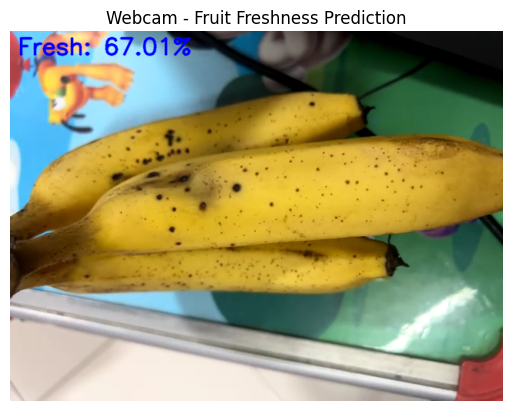

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


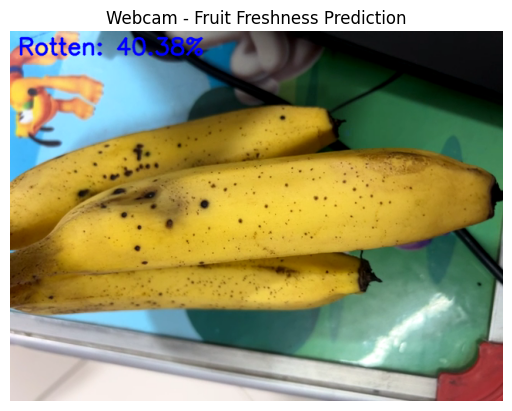

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


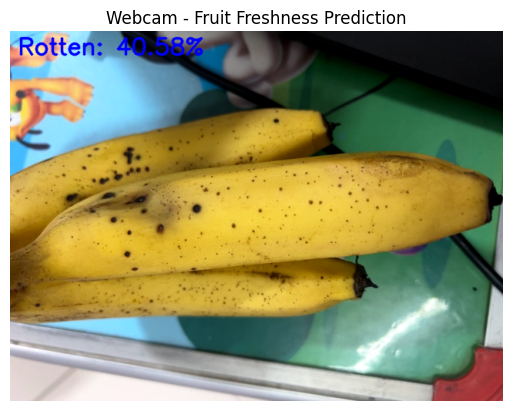

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


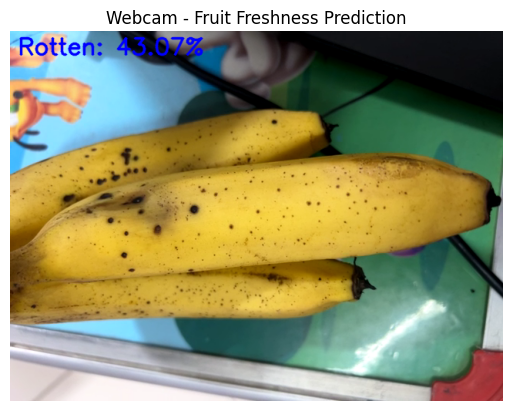

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


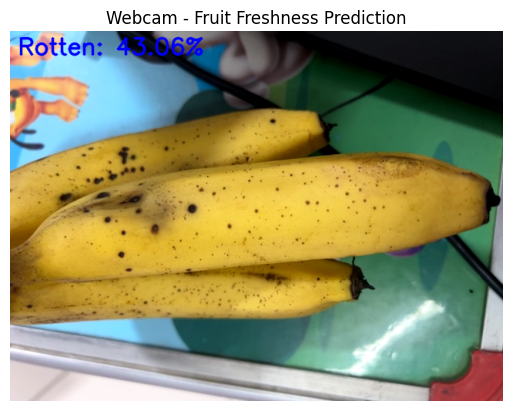

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


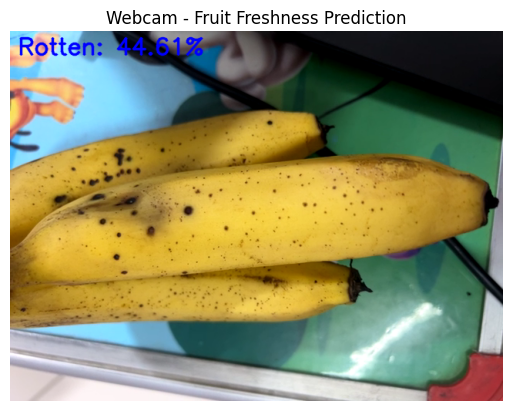

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


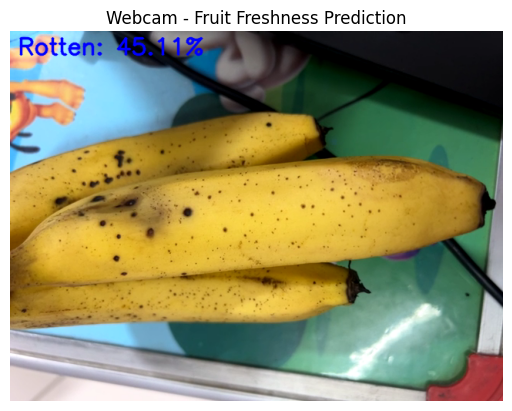

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


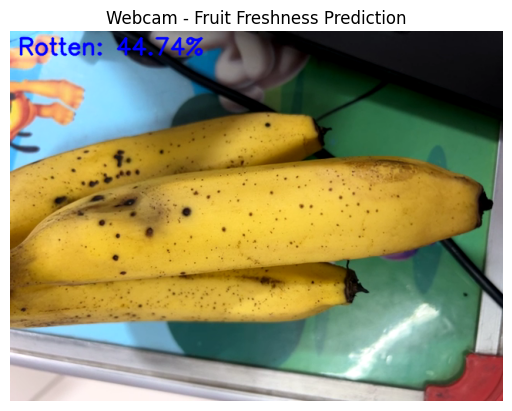

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


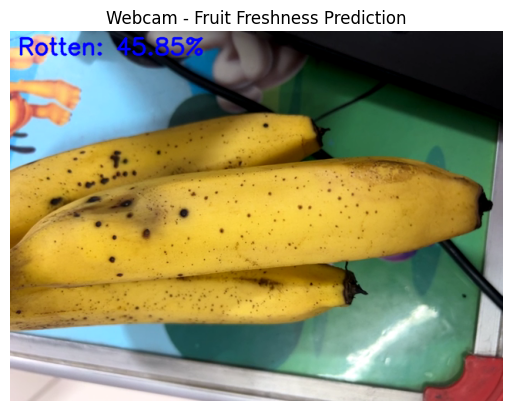

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


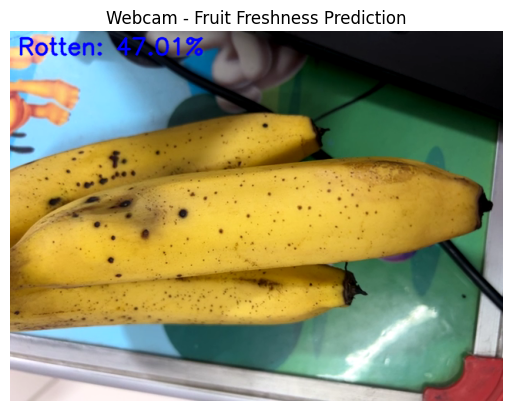

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


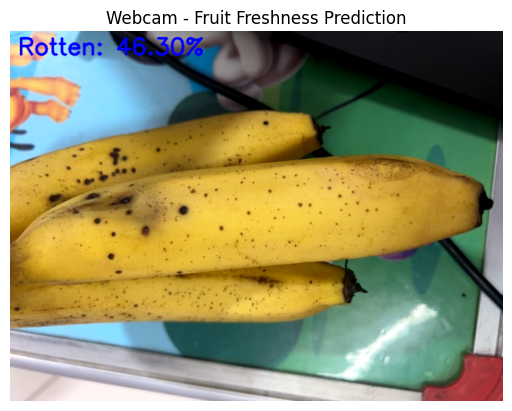

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


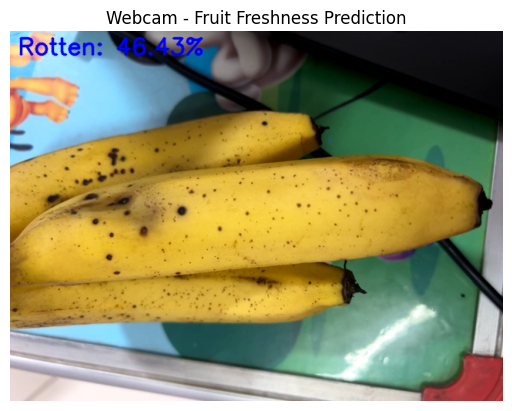

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


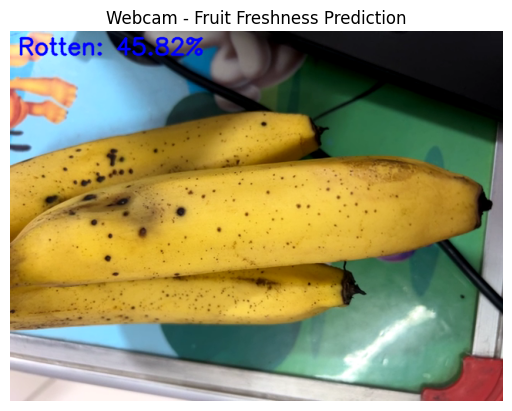

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


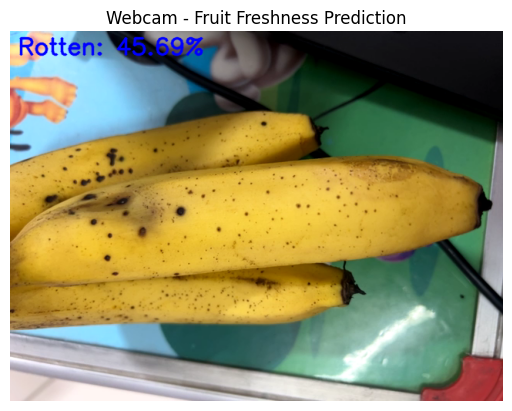

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


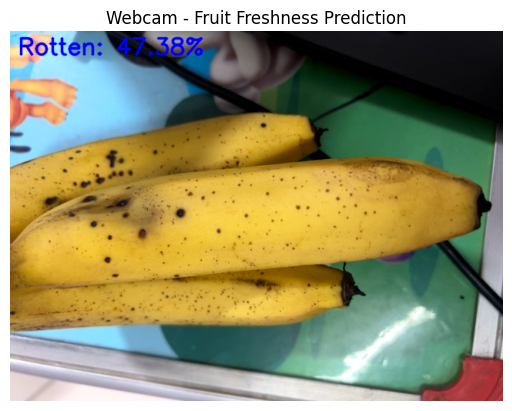

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


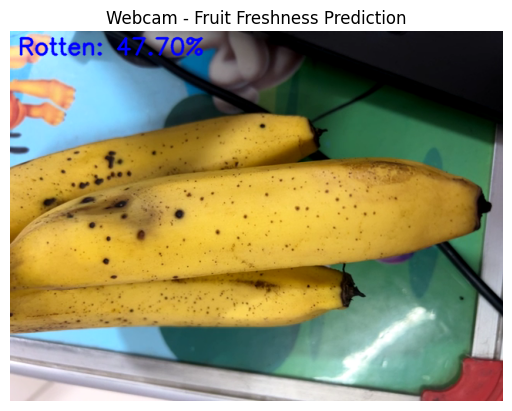

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


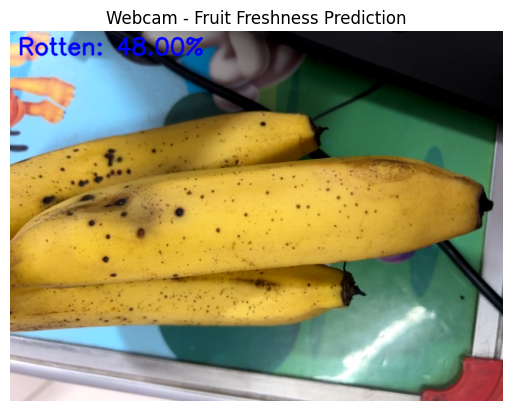

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


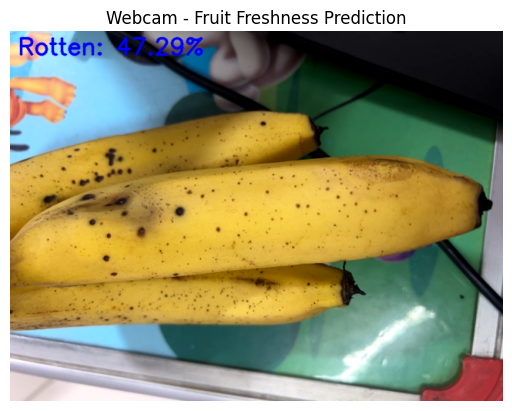

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


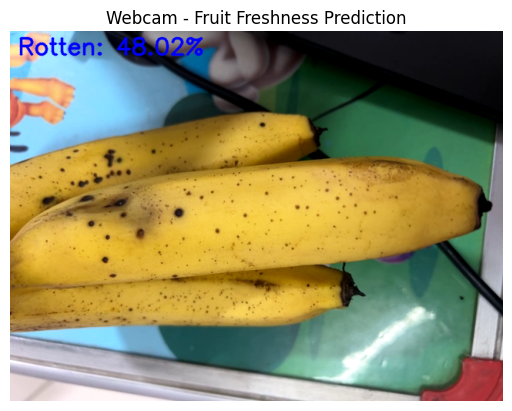

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


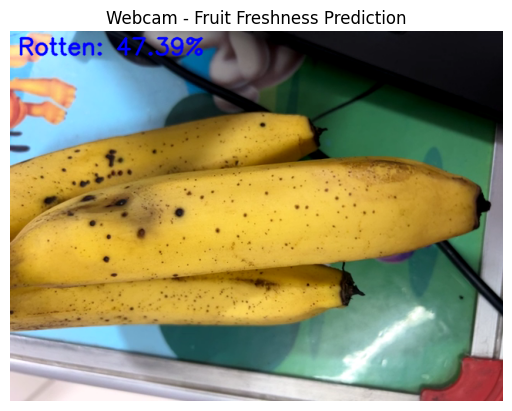

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


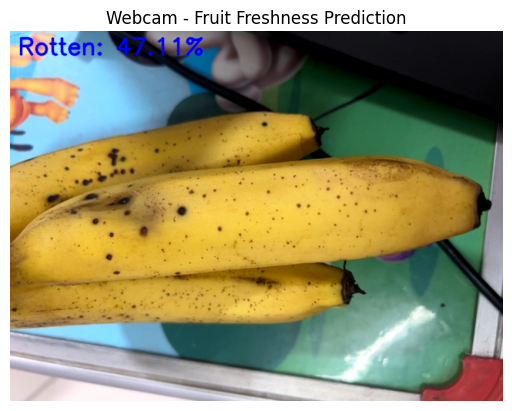

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


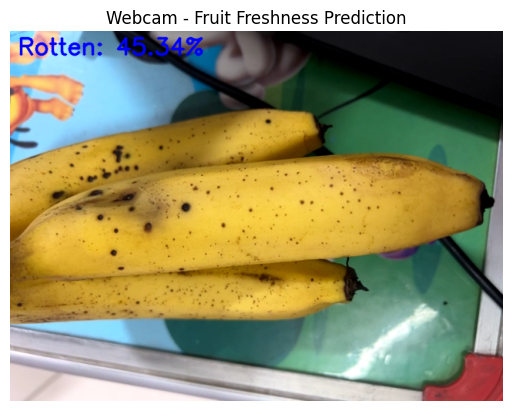

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


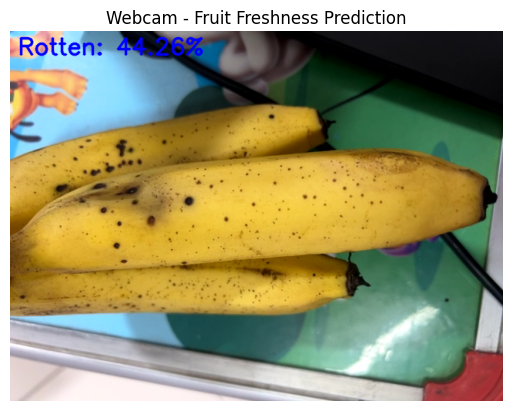

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


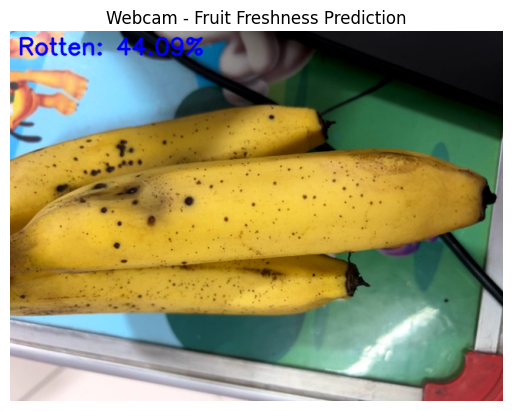

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


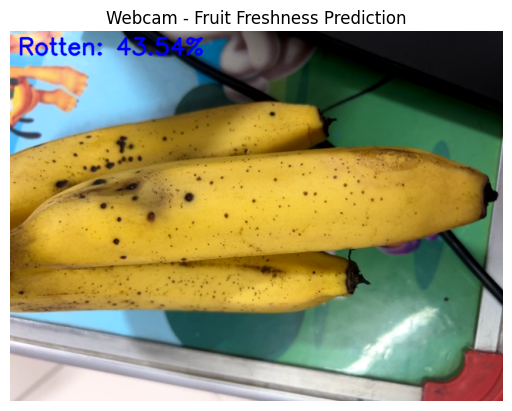

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


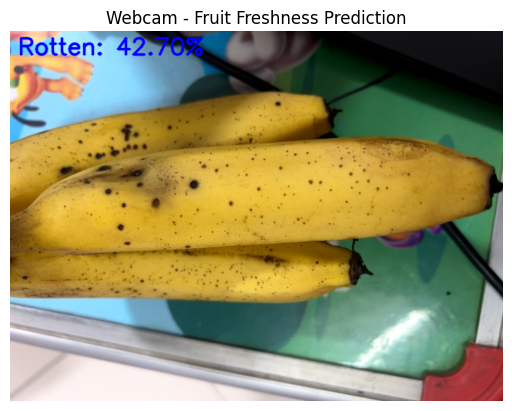

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


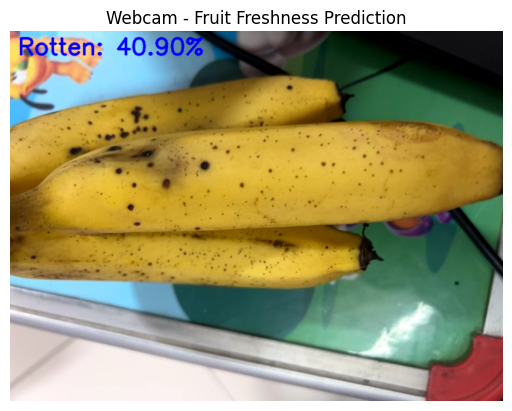

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
Terminated by user.


In [52]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load the saved model
model = tf.keras.models.load_model('fruit_freshness_classifier.h5')

# Set the threshold for predictions
threshold = 0.4  # Adjust as needed

# Initialize webcam
camera = cv2.VideoCapture(1)  # Use 0 for the default camera

plt.ion()  # Enable interactive mode for Matplotlib

try:
    while True:
        # Capture frame from webcam
        return_value, frame = camera.read()

        # Check if frame is captured successfully
        if not return_value:
            print("Failed to capture image")
            break

        # Resize frame to match model's expected input
        resized_frame = cv2.resize(frame, (150, 150))

        # Preprocess the image
        img_array = image.img_to_array(resized_frame)  # Convert to array
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array /= 255.0  # Normalize the image

        # Make a prediction
        prediction = model.predict(img_array)
        confidence = prediction[0][0]  # Assuming a binary output

        # Interpret the result
        if confidence > threshold:
            label = "Rotten"
            confidence_percentage = confidence * 100
        else:
            label = "Fresh"
            confidence_percentage = (1 - confidence) * 100

        # Display prediction on the frame
        cv2.putText(frame, f"{label}: {confidence_percentage:.2f}%", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

        # Convert the frame from BGR to RGB for Matplotlib
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Clear the previous frame in Matplotlib
        plt.clf()  # Clear the current figure
        plt.imshow(rgb_frame)
        plt.title('Webcam - Fruit Freshness Prediction')
        plt.axis('off')
        plt.pause(0.001)  # Pause to allow the figure to update

        # Exit loop if 'q' is pressed
        if plt.waitforbuttonpress(timeout=0.1):  # Wait for a key press in Matplotlib
            break

except KeyboardInterrupt:
    print("Terminated by user.")

# Release the camera and close the plot
camera.release()
plt.close()  # Close the plot
